In [1]:
# Importing the Libraries
import cv2
import matplotlib.pyplot as plt
%matplotlib inline 

In [2]:
# Imgshow helper function
def imgshow(img):
    plt.figure(figsize=(10,10))
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(rgb_img)


# Thresholding

In [23]:
# Read the image
dog = cv2.imread('../img/dig.jpg')
gray_dog = cv2.imread('../img/dog.jpg', cv2.IMREAD_GRAYSCALE)

In [24]:
# Different Types of Thresholding
_, binary = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_BINARY)
_, binary_inv = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_BINARY_INV)
_, ostu = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_OTSU)
_, to_zero = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_TOZERO)
_, thres_trian = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_TRIANGLE)
_, thres_trunc = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_TRUNC)

Text(0.5, 1.0, 'To zero thresholding')

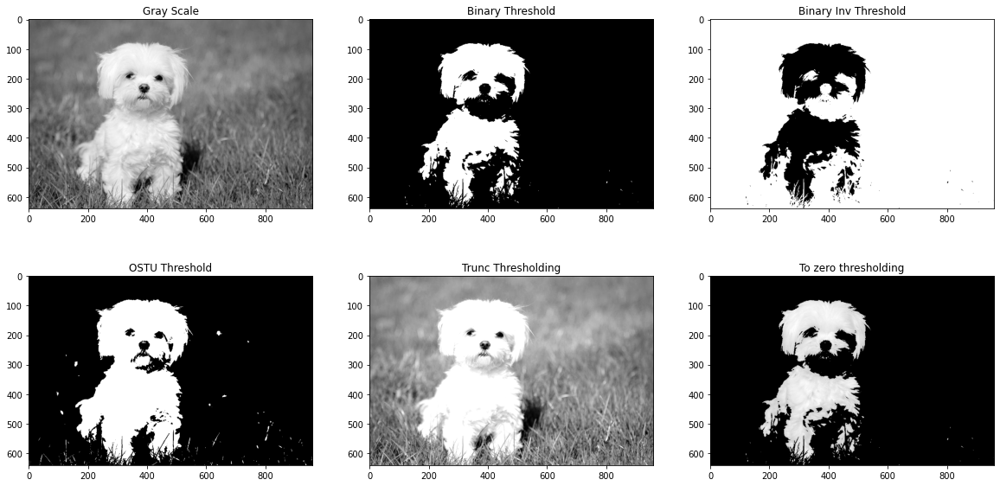

In [25]:
# Displaying global thresholding using subplots
fig, ax = plt.subplots(2,3, figsize=(20,10))
ax[0][0].imshow(gray_dog, cmap='gray')
ax[0][0].set_title("Gray Scale")
ax[0][1].imshow(binary, cmap='gray')
ax[0][1].set_title("Binary Threshold")
ax[0][2].imshow(binary_inv, cmap='gray')
ax[0][2].set_title("Binary Inv Threshold")
ax[1][0].imshow(ostu, cmap='gray')
ax[1][0].set_title("OSTU Threshold")
ax[1][1].imshow(thres_trunc, cmap='gray')
ax[1][1].set_title("Trunc Thresholding")
ax[1][2].imshow(to_zero, cmap='gray')
ax[1][2].set_title("To zero thresholding")

## Adaptive Thresholding

It uses neighborhood of the pixels with the specific block size

In [27]:
# cv2.adaptiveThreshold() : Takes src image, max_value, adaptiveMethod, threshold_type, blocksize, and constant C
# Transforms grayscale image into binary image based on the adaptiveMethod

# Read the gray scale image
words_gray = cv2.imread('../img/notes.png', 0)

In [65]:
# Apply Adaptive Thresholding
# Block Size : must be an odd number 
# threshold type must be BINARY or BINARY_INV
mean_adaptive = cv2.adaptiveThreshold(words_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 3)
gaussian_adaptive = cv2.adaptiveThreshold(words_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 3)


Text(0.5, 1.0, 'Binary Gaussian Adaptive Thresholding')

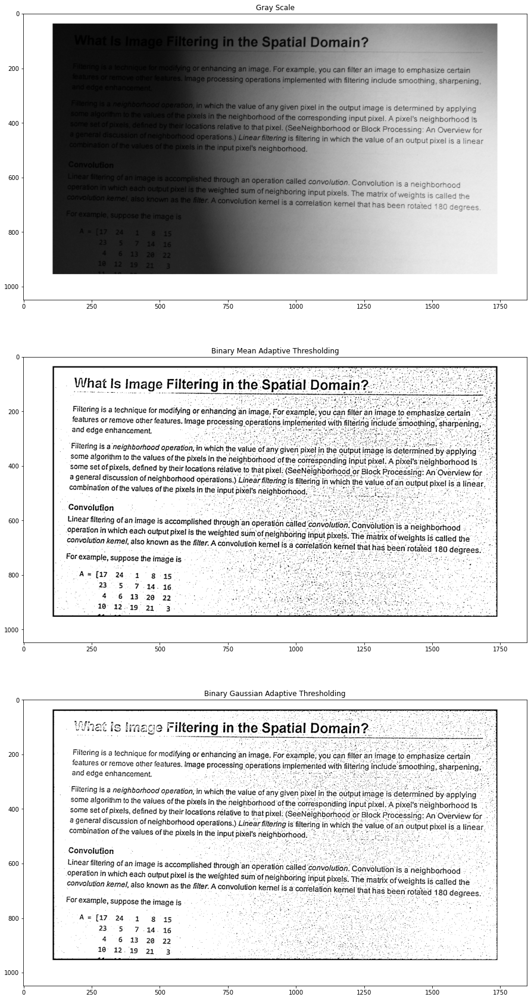

In [66]:
# Displaying Adaptive thresholding using subplots
fig, ax = plt.subplots(3,1, figsize=(40,30))
ax[0].imshow(words_gray, cmap='gray')
ax[0].set_title("Gray Scale")
ax[1].imshow(mean_adaptive, cmap='gray')
ax[1].set_title("Binary Mean Adaptive Thresholding")
ax[2].imshow(gaussian_adaptive, cmap='gray')
ax[2].set_title("Binary Gaussian Adaptive Thresholding")


## Morphological Transformations

In [80]:
# Create a Kernel inorder to use morphological transformations
# Creating a square kernel
import numpy as np

kernel = np.ones((3,3), np.uint8)
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

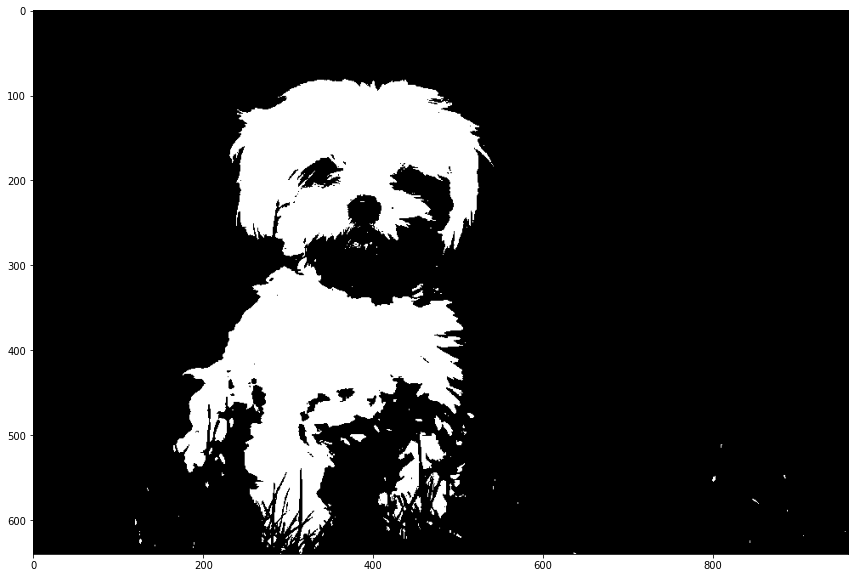

In [81]:
# First Applying Thresholding
ret, threshold = cv2.threshold(gray_dog, 200, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(15,10))
plt.imshow(threshold, cmap='gray')


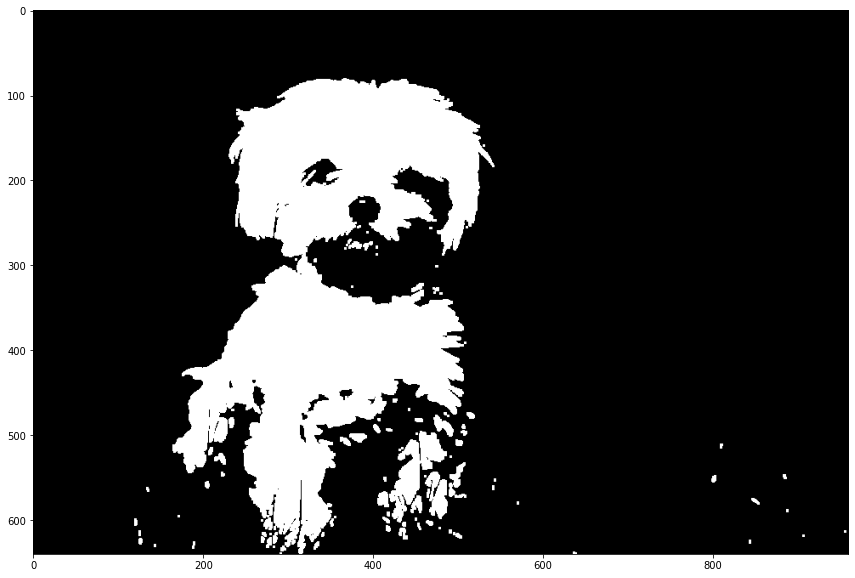

In [82]:
# As we can see from the thresholding we have some noise the image.
# So, lets see what the morphological transformation does

# Dilation (Can play around with iterations which run dilation based on the number of iterations)
dilation = cv2.dilate(threshold, kernel)
plt.figure(figsize=(15,10))
plt.imshow(dilation, cmap='gray')

With dilation the noise got bigger because it is dilating the white pixels.

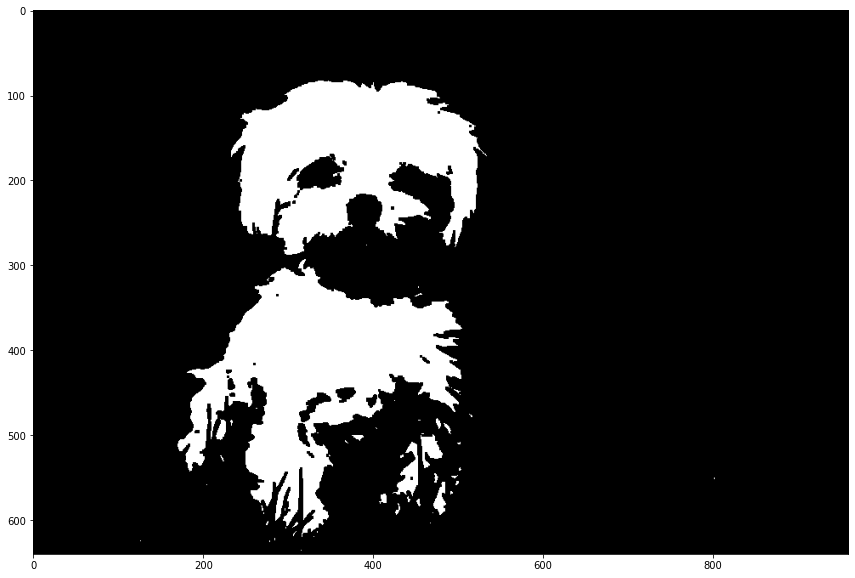

In [84]:
# Erosion
erosion = cv2.erode(threshold, kernel)
plt.figure(figsize=(15,10))
plt.imshow(erosion, cmap='gray')


We can see that from erosion the most of the noises disappeared as it thin downs the white pixels.

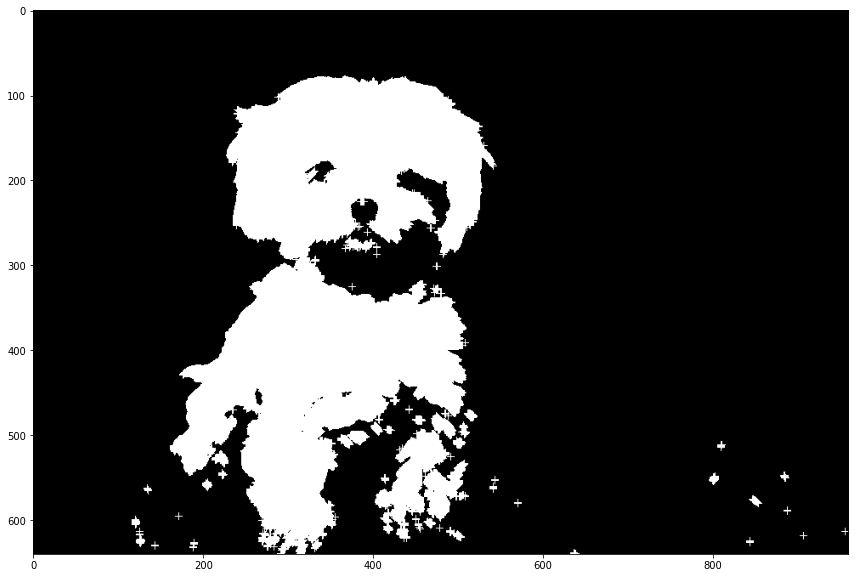

In [93]:
# With the kernel method
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (9,9))
dilation = cv2.dilate(threshold, kernel)
plt.figure(figsize=(15,10))
plt.imshow(dilation, cmap='gray')


In [110]:
# Checking other kernels
rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9,9))
ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,9))

Text(0.5, 1.0, 'Dilation with Ellipse Kernel')

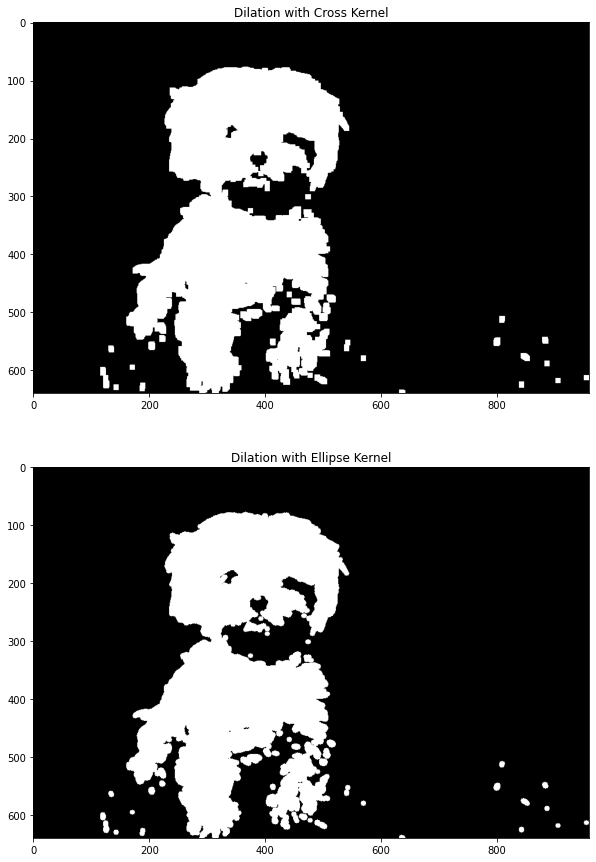

In [111]:
cross_dilation = cv2.dilate(threshold, rect_kernel)
ellipse_dilation = cv2.dilate(threshold, ellipse_kernel)
fig, ax = plt.subplots(2, 1, figsize=(20,15))
ax[0].imshow(cross_dilation, cmap='gray')
ax[0].set_title("Dilation with Cross Kernel")
ax[1].imshow(ellipse_dilation, cmap='gray')
ax[1].set_title('Dilation with Ellipse Kernel')

In [136]:
# Opening & Closing
j1 = cv2.imread('../img/j1.png')
j2 = cv2.imread('../img/j2.png')
opening = cv2.morphologyEx(j2, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(j1, cv2.MORPH_CLOSE, kernel)

Text(0.5, 1.0, 'Applied Morph Close')

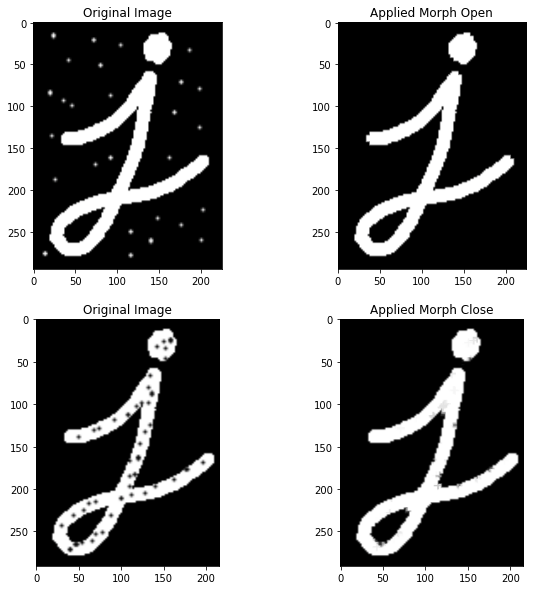

In [142]:
fig, ax = plt.subplots(2,2, figsize=(10,10))
ax[0][0].imshow(j2, cmap='gray')
ax[0][0].set_title("Original Image")
ax[0][1].imshow(opening, cmap='gray')
ax[0][1].set_title("Applied Morph Open")
ax[1][0].imshow(j1, cmap='gray')
ax[1][0].set_title("Original Image")
ax[1][1].imshow(closing, cmap='gray')
ax[1][1].set_title("Applied Morph Close")

## Kernels

In [149]:
# Blur Kernels
blur_kernels = np.ones((10,10), np.float32)/100
blur_kernels

array([[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
       [0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]],
      dtype=float32)

In [179]:
# Read the image
begnas = cv2.cvtColor(cv2.imread('../img/lake.jpg'), cv2.COLOR_BGR2RGB)
begnas_gray = cv2.imread('../img/lake.jpg', 0)

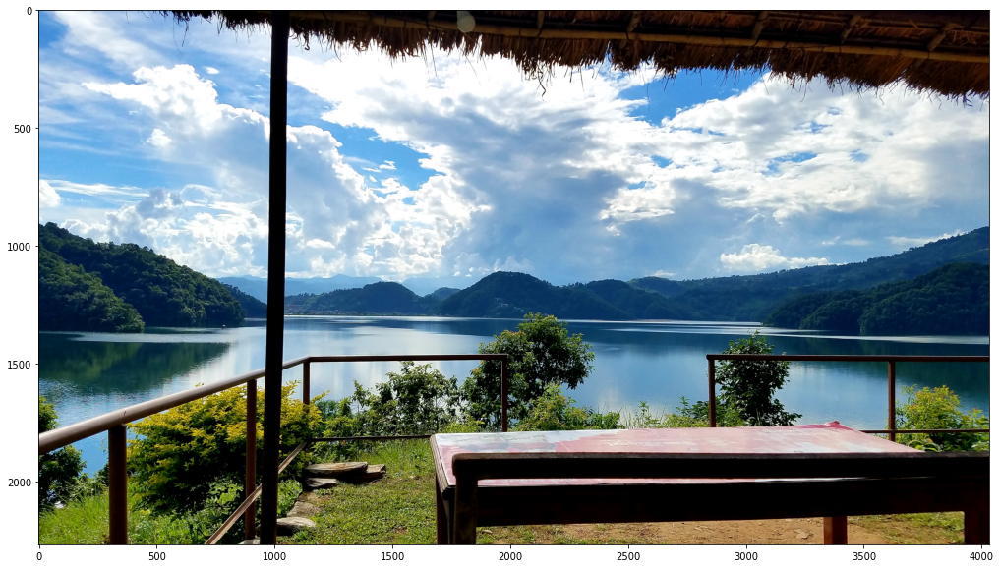

In [152]:
plt.figure(figsize=(30,10))
plt.imshow(begnas)

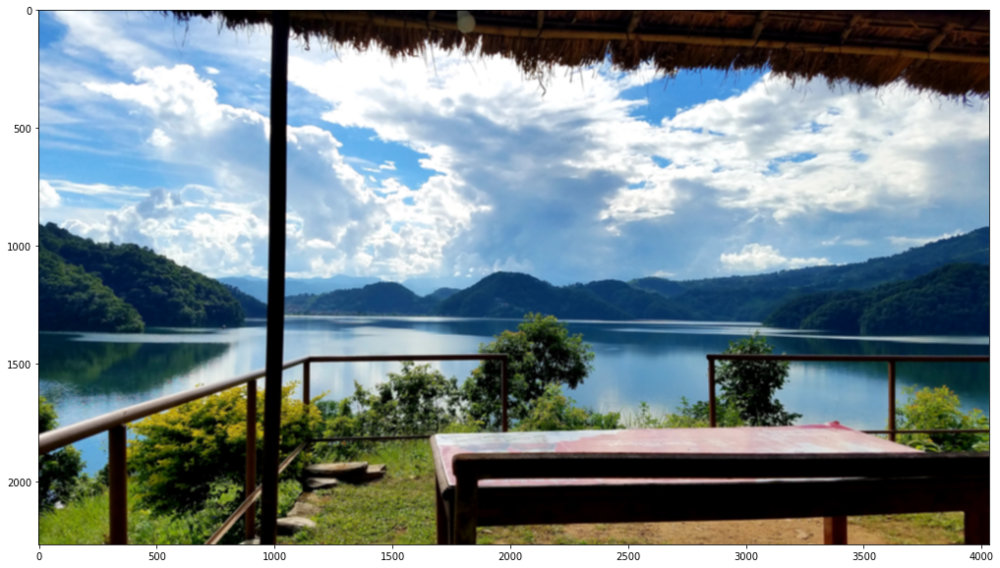

In [153]:
# Apply Blur kernel
gaussian_begnas = cv2.filter2D(begnas, -2, blur_kernels)
plt.figure(figsize=(30,10))
plt.imshow(gaussian_begnas)

In [160]:
# Apply kernels from opencv
blur_kernel = cv2.blur(begnas, (8,8))
gaus_kernel = cv2.GaussianBlur(begnas, (7,7), 2)
medianblur_kernel = cv2.medianBlur(begnas, 7)

Text(0.5, 1.0, 'Median Blur Kernel')

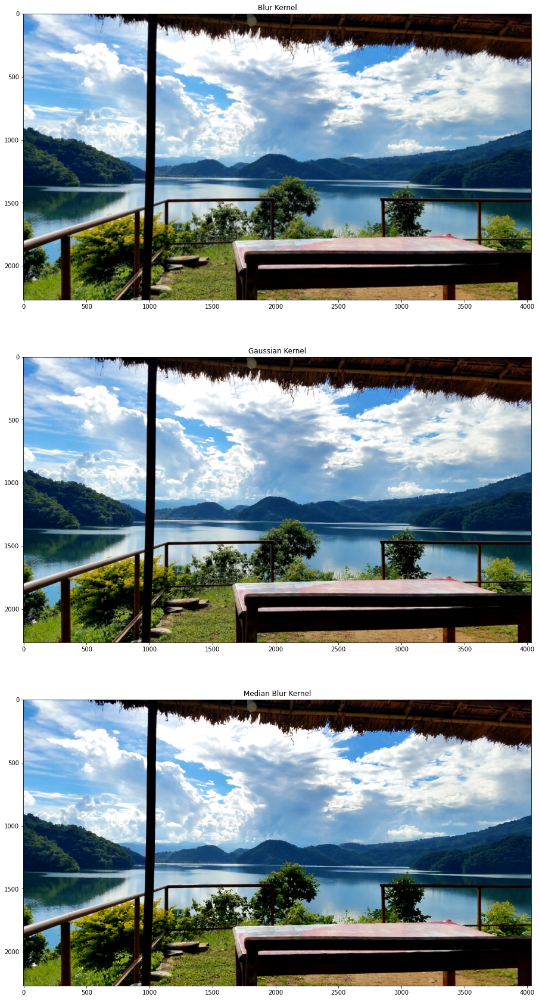

In [161]:
# Displaying Different Blur using subplots
fig, ax = plt.subplots(3,1, figsize=(40,30))
ax[0].imshow(blur_kernel)
ax[0].set_title("Blur Kernel")
ax[1].imshow(gaus_kernel)
ax[1].set_title("Gaussian Kernel")
ax[2].imshow(medianblur_kernel)
ax[2].set_title("Median Blur Kernel")

In [171]:
# Sharpening Images
sharpening_kernel = np.ones((4,4), np.float32) * -1
sharpening_kernel[1,1] = 16
sharpening_kernel

array([[-1., -1., -1., -1.],
       [-1., 16., -1., -1.],
       [-1., -1., -1., -1.],
       [-1., -1., -1., -1.]], dtype=float32)

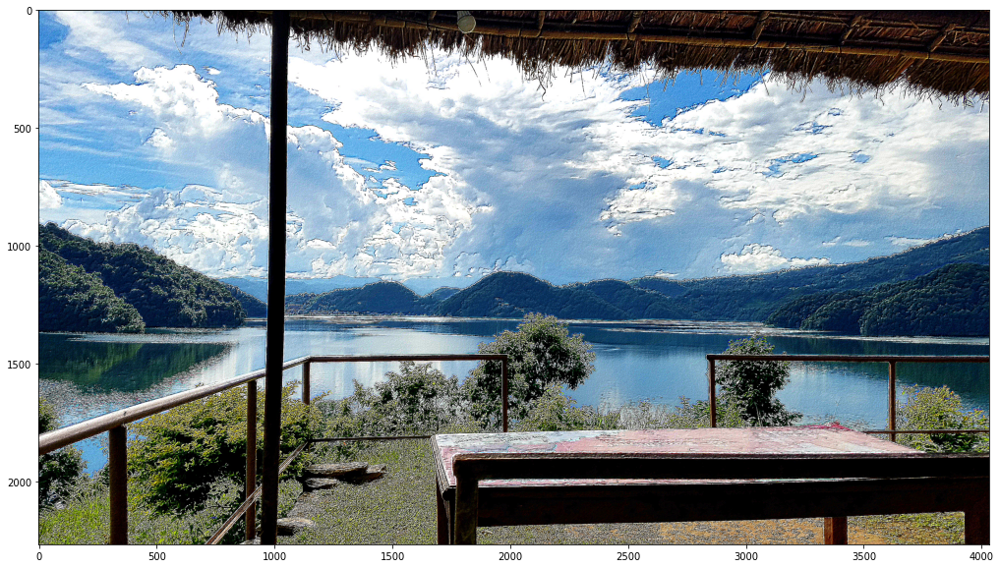

In [172]:
begnas_sharp = cv2.filter2D(begnas, -1, sharpening_kernel)
plt.figure(figsize=(30,10))
plt.imshow(begnas_sharp)

In [177]:
# Edge Detection Kernel
edge_kernel = np.ones((3,3), np.float32) * -1
edge_kernel[1,1] = 8
edge_kernel

array([[-1., -1., -1.],
       [-1.,  8., -1.],
       [-1., -1., -1.]], dtype=float32)

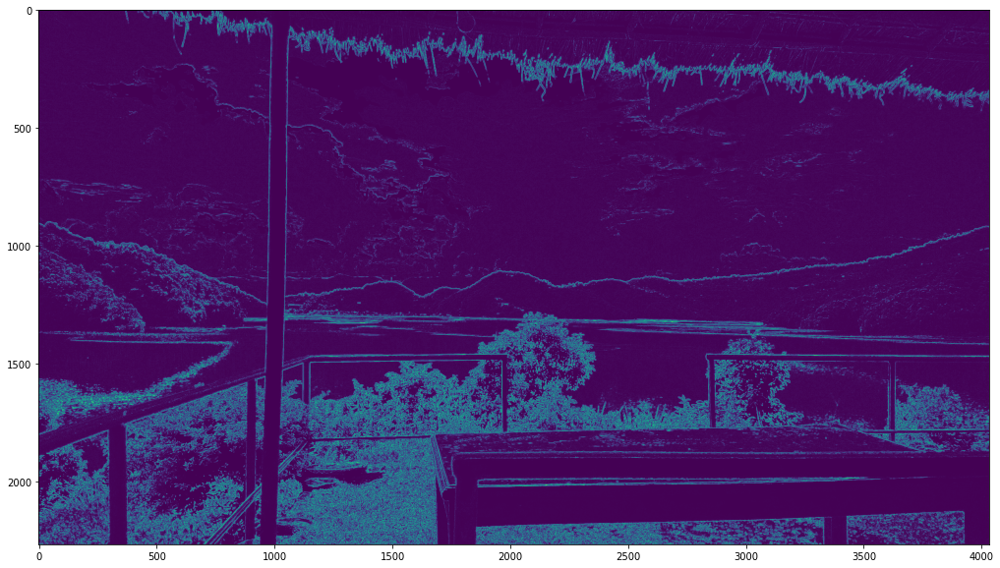

In [181]:
begnas_edge = cv2.filter2D(begnas_gray, -1, edge_kernel)
plt.figure(figsize=(30,10))
plt.imshow(begnas_edge)

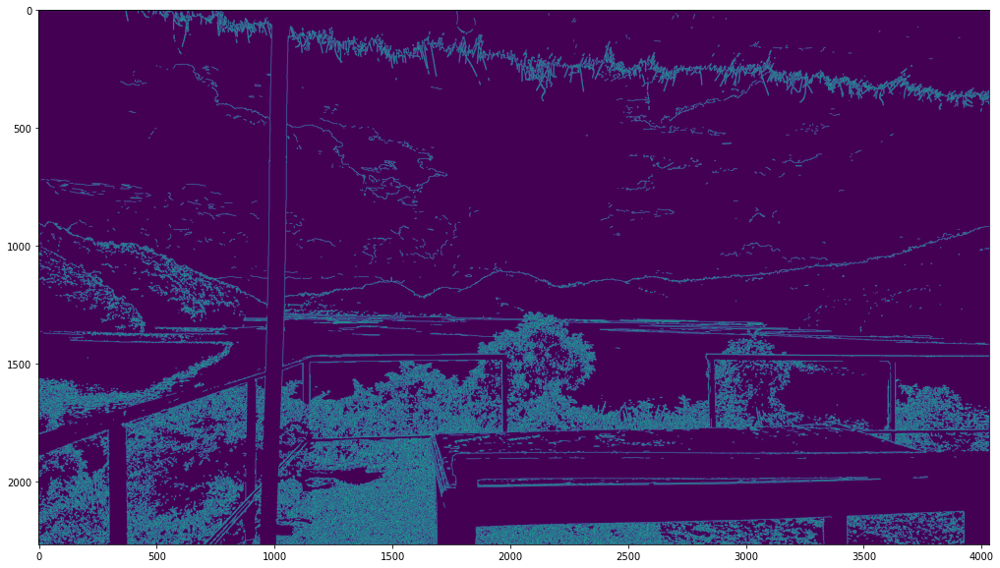

In [183]:
# Canny Edges
canny_begnas = cv2.Canny(begnas_gray, 150, 255)
plt.figure(figsize=(30,10))
plt.imshow(canny_begnas)
